# Intellijel Shapeshifter wavetable workbook

<img style="float: right; width: 20%; margin: -4rem 0 0 1rem" src="https://intellijel.com/wp-content/uploads/2016/12/Shapeshifter-new-2000px.jpg"/>

In this notebook, we demonstrate extraction, conversion and display of wavetable data from the Intellijel/Cylonix Shapeshifter Eurorack synth module firmware.

## Constants

This information is mostly taken from the Shapeshifter manual, addresses are confirmed for the firmware file below.

The Shapeshifter has 128 wavetables of 8 waveforms each. Waveforms are 512 samples of 2 bytes (16 bits) each.

In [1]:
FIRMWARE_FILEPATH = 'shapeshifter_v2.01.1.jic'

NAMES_ADDRESS = 0x0f009b
NAME_LENGTH = 8

WAVETABLES_ADDRESS = 0x10009b
WAVETABLE_COUNT = 128

WAVEFORM_COUNT = 8
WAVEFORM_SAMPLES = 512
WAVEFORM_BYTES = 2
WAVEFORM_LENGTH = WAVEFORM_SAMPLES * WAVEFORM_BYTES

## Functions

Data in the firmware file is little-endian, with each byte binary reversed. We need some functions to convert between this format and the Python representation.

In [2]:
def reverse_bits(byte):
    '''Reverse the bits of a byte, return string of binary digits'''
    
    return '{:08b}'.format(byte)[::-1]

## Extract data

In [3]:
from struct import unpack

with open(FIRMWARE_FILEPATH, 'rb') as f:
    
    # read wavetable names
    f.seek(NAMES_ADDRESS)
    names = []
    for i in range(WAVETABLE_COUNT):
        
        data = f.read(NAME_LENGTH)
        # reverse each bit
        data = [int(reverse_bits(byte), 2) for byte in data]
        # join chr value of each byte to a string
        name = ''.join(chr(byte) for byte in data)
        names.append(name)
    
    # read wavetable data
    f.seek(WAVETABLES_ADDRESS)
    wavetables = []
    for i in range(WAVETABLE_COUNT):
        waveforms = []
        for j in range(WAVEFORM_COUNT):    
            
            data = f.read(WAVEFORM_LENGTH)    
            # reverse each bit
            data = [int(reverse_bits(byte), 2) for byte in data]
            # unpack 512 * 2 bytes little-endian
            data = unpack('<%ih' % WAVEFORM_SAMPLES, bytes(data))
            waveforms.append(data)
        
        wavetables.append(waveforms)

## Plot wavetables

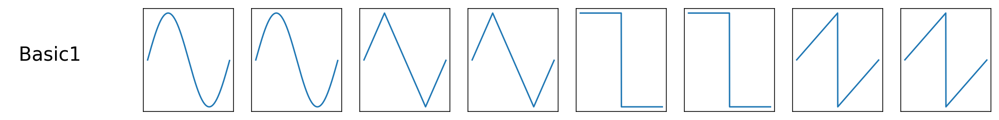

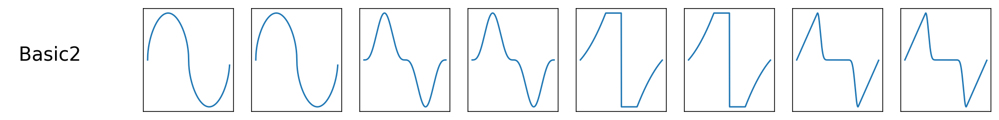

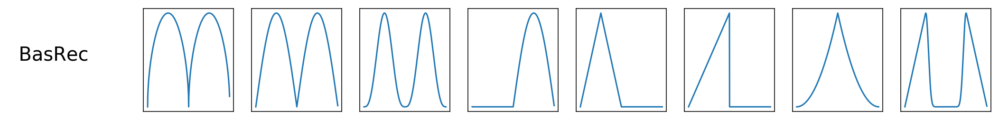

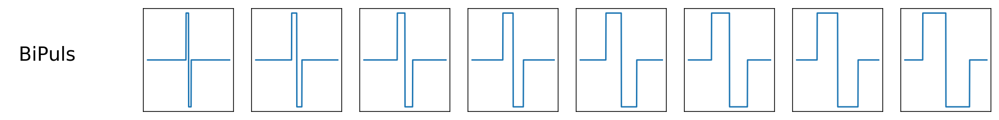

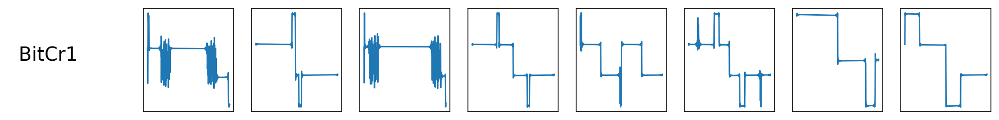

...

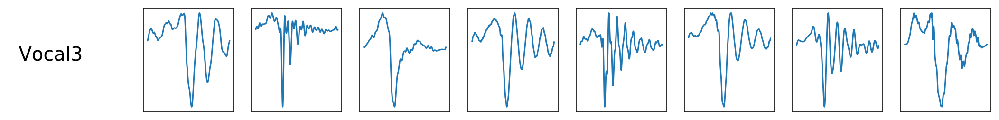

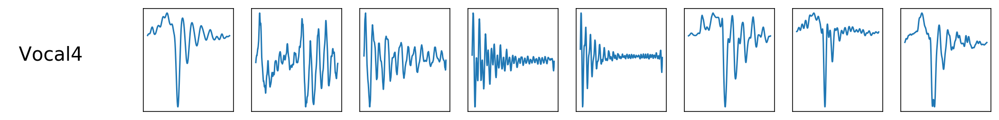

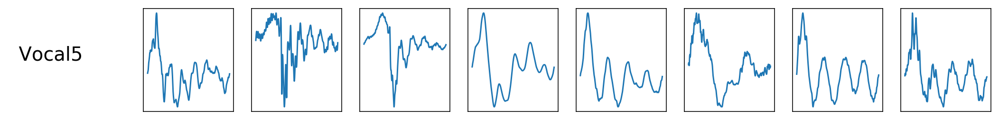

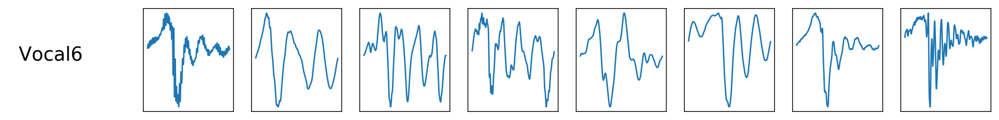

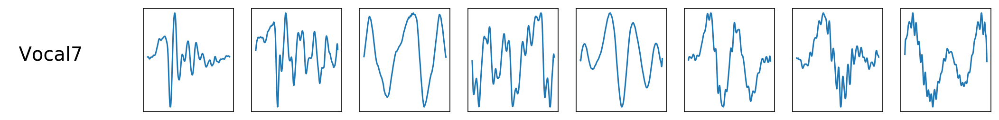

In [5]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import matplotlib.pyplot as plots

fig_width = 16
fig_height = 2
fig_rows = 1
fig_cols = 8

for i, (name, wavetable) in enumerate(zip(names, wavetables), start=1):
    plots.figure(i, (fig_width, fig_height))
    plots.figtext(0, 0.5, name, size=20)
    
    for j, waveform in enumerate(wavetable, start=1):
        plots.subplot(fig_rows, fig_cols, j)
        plots.plot(waveform)
        plots.xticks([])
        plots.yticks([])
    
    plots.show()

## Import wavetable data

Having made it this far, we can now try to import wave data. Below, we scan the local folder `wavetables` in the working directory, load the data and parse out table names.

In [ ]:
import os
import soundfile as sf

INT_RANGE = 2**15
SF_SUBTYPE_BITRATE_FACTOR = {
    'PCM_16': 1,
    'PCM_24': 1.5,
    'FLOAT': 2
}

names = []
wavetables = []

for file in os.scandir('wavetables'):
    
    if file.is_dir():
        continue
    
    info = sf.info(file.path)
    
    if info.channels > 1:
        continue
    
    samplerate_factor = int(info.samplerate / 44100)
    bitrate_factor = SF_SUBTYPE_BITRATE_FACTOR.get(info.subtype)
    blocksize = WAVEFORM_LENGTH * samplerate_factor * bitrate_factor

    data = [array for array in sf.blocks(file.path, blocksize=blocksize)]

    # convert to 16-bit integer
    if info.subtype == 'FLOAT':
        data = [[int(x * INT_RANGE) for x in array] for array in data]

    names.append(file.name)
    wavetables.append(data)

fig_cols = 8
fig_width = 16

for i, (name, wavetable) in enumerate(zip(names, wavetables), start=1):
    
    fig_rows = len(wavetable) // fig_cols + 1
    fig_height = fig_width * (fig_rows / fig_cols)
    
    plots.figure(i, (fig_width, fig_height))
    plots.figtext(0, 0.8, name, size=12)
    
    for j, waveform in enumerate(wavetable, start=1):
        plots.subplot(fig_rows, fig_cols, j)
        plots.plot(waveform)
        plots.xticks([])
        plots.yticks([])
    
    plots.show()
    